In [2]:
%run "part01_preprocessing.ipynb"

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 9 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
 8   Unnamed: 8   0 non-null       float64
dtypes: float64(3), int64(1), object(5)
memory usage: 37.2+ MB


# Data Preparation

In [98]:
from matplotlib import pyplot as plt
import seaborn as sns
%matplotlib inline

from sklearn.preprocessing import LabelEncoder, StandardScaler, MinMaxScaler, RobustScaler, PowerTransformer
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering
from sklearn.metrics import silhouette_score
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer
from umap.umap_ import UMAP
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestRegressor

from sklearn.mixture import GaussianMixture
from scipy.cluster import hierarchy
from itertools import combinations

from plotly.offline import plot, iplot, init_notebook_mode
from plotly import express as px
from plotly.subplots import make_subplots
import plotly as py
import plotly.graph_objs as go

from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline

### Content

* **Data Preparation**
    - Normalization
    - Standardization
    - Feature Selection
    - Dealing with Outliers
* **Modeling**
    - Kmeans
        - Elbow Method, Silhouette Score
    - Gaussian Mixture Model
        - AIC, BIC, hierarchy
    - DBScan
    - Hierarchical Clustering
* **Dimensionality Reduction**
    - PCA
    - UMAP
    - TSNE
* **Evaluating Metrics**    - 


    
* **Hiperparmters Tunning**
* **Dump Model**


In [99]:
data_prep = data_client.copy()

In [5]:
data_prep.isna().sum()

GrossRevenueTotal    0
RecencyDays          0
Frequency            0
dtype: int64

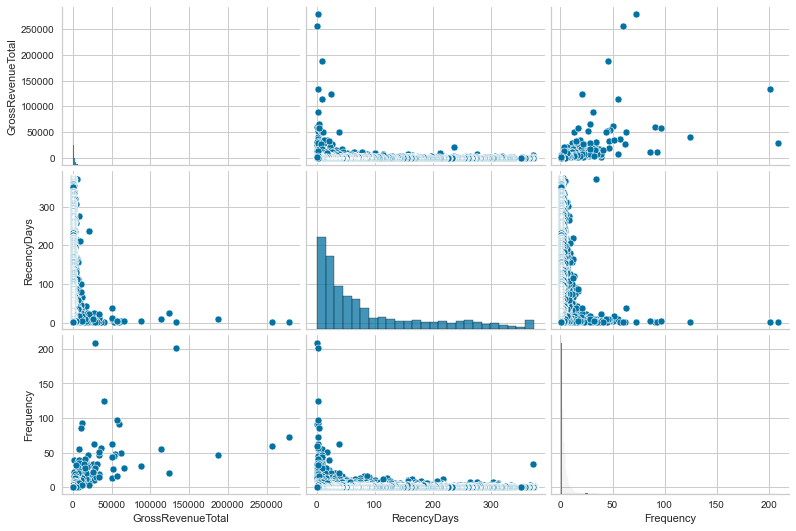

In [6]:
sns.pairplot(data_prep, aspect=1.5)
plt.show()

### Standardization

In [7]:
log_columns = data_prep.skew().sort_values(ascending=False)
log_columns = log_columns.loc[log_columns > 0.75]
log_columns

GrossRevenueTotal    21.585393
Frequency            12.045707
RecencyDays           1.249082
dtype: float64

In [8]:
# The log transformations
for col in log_columns.index:
    data_prep[col] = np.log1p(data_prep[col])

In [9]:
#ss = StandardScaler()
#rs = RobustScaler()
#pt = PowerTransformer()

# MinmmaxScaler provides better resutls

mms = MinMaxScaler()


for col in data_prep.columns:
    data_prep[col] = mms.fit_transform(data_prep[[col]]).squeeze()

In [10]:
from sklearn.preprocessing import FunctionTransformer
from sklearn.pipeline import Pipeline

# The custom NumPy log transformer
log_transformer = FunctionTransformer(np.log1p)
estimators = [('log1p', log_transformer), ('mms', MinMaxScaler())]
pipeline = Pipeline(estimators)
data_pipe = pipeline.fit_transform(data_client)
np.allclose(data_pipe, data_prep)

True

In [11]:
features = ['GrossRevenueTotal', 'RecencyDays', 'Frequency'] # We will use all features
X = data_prep[features].copy() 

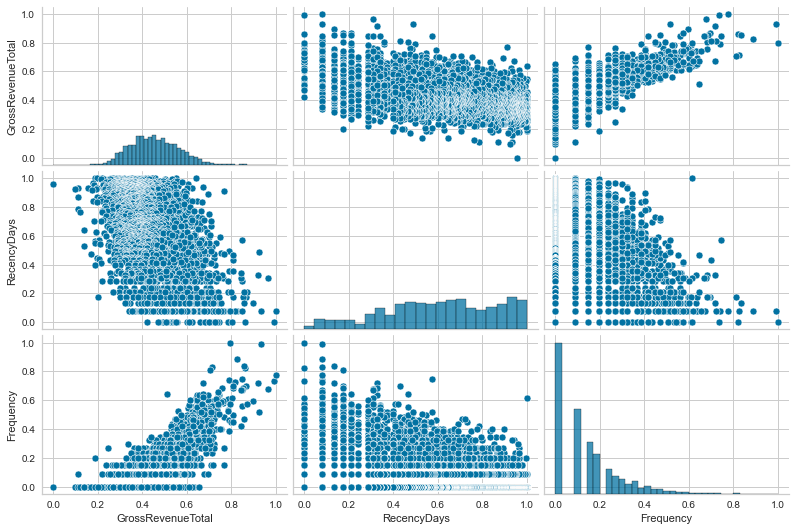

In [12]:
sns.pairplot(X, aspect=1.5)#
plt.show()

## Dimensonality Reduction - Variable Spaces

In [13]:
clusters_results = X.copy()

### UMAP

In [14]:
# Dimensionality Reduction using technique UMAP 
umap = UMAP( random_state=3456)
umap_embedding = umap.fit_transform(X)

# X,y axis representation for UMAP
clusters_results['umap_x'] = umap_embedding[:,0]
clusters_results['umap_y'] = umap_embedding[:,1]

### TSNE

In [15]:
# Dimensionality Reduction using technique TSNE
tsne = TSNE( n_components=2, init='pca', learning_rate='auto', n_jobs=-1, random_state=3456)
tsne_embedding = tsne.fit_transform(X)

# X,y axis representation using TSNE
clusters_results['tsne_x'] = tsne_embedding[:,0]
clusters_results['tsne_y'] = tsne_embedding[:,1]

C:\Users\Alysson\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



In [16]:
clusters_results

,GrossRevenueTotal,RecencyDays,Frequency,umap_x,umap_y,tsne_x,tsne_y
CustomerID,,,,,,,
17850,0.638772,0.999490,0.615003,16.587051,1.668091,13.421610,65.418365
13047,0.589531,0.535628,0.366301,16.904604,6.878082,54.411797,26.065199
12583,0.666699,0.132437,0.446811,14.819579,12.711712,63.986713,-15.090689
13748,0.482357,0.741637,0.236060,15.430046,1.299198,7.576268,55.761478
15100,0.445907,0.978449,0.148937,13.987630,-1.100407,-13.432817,58.237530
...,...,...,...,...,...,...,...
13436,0.339589,0.077471,0.000000,10.942719,15.811964,35.044922,-42.773659
15520,0.390068,0.077471,0.000000,11.051549,15.759743,35.283615,-42.299320
13298,0.394328,0.077471,0.000000,11.029748,15.771748,35.297661,-42.264164


# Hyperparameter Tuning

In [19]:
clusters = np.arange(2,13,1)

### Kmeans

In [22]:
# Tunning kmeans trying to find optimal K aaccording to metrics above

kmeans_wcss = []
kmeans_ss = []
kmeans_centroid = []

for k in clusters:
    test_kmeans = KMeans( n_clusters=k, init = "k-means++", random_state=3)
    test_labels = test_kmeans.fit_predict(X)
    sil = silhouette_score(X, test_labels, metric='euclidean')
    kmeans_ss.append(sil)
    kmeans_wcss.append(test_kmeans.inertia_)
    kmeans_centroid.append(test_kmeans.cluster_centers_)  
    
kmeans_resume = pd.DataFrame({"Kmeans-Clusters": clusters,
                              "Silhouete Score":kmeans_ss, 
                              "WCSS": kmeans_wcss, 
                             # "Centroids": kmeans_list_centroid,
                              })

In [21]:
temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12)))

In [23]:
### Using Optimal Value = 6
kmeans = KMeans( n_clusters=7, max_iter=300, n_init=1, init = "k-means++", verbose=0,random_state=3456) 
kmeans_labels = kmeans.fit_predict(X)
clusters_results['KMeans-Cluster'] = kmeans_labels

In [24]:
clusters_results=clusters_results.sort_values(by='KMeans-Cluster', ascending=True)
clusters_results['KMeans-Cluster'] = clusters_results['KMeans-Cluster'].astype(str)

In [25]:
#sns.scatterplot(x=clusters_results['RecencyDays'], y=clusters_results['GrossRevenueTotal'], hue=clusters_results['KMeans-Cluster'])

### UMAP and TSNE Plot

In [41]:
fig = px.scatter(clusters_results, x="umap_x", y="umap_y", color="KMeans-Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="K-Means Cluster UMAP<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='umap_x', showline=True, zeroline=False), 
                  yaxis=dict(title='umap_y',showline=True, zeroline=False))
fig.show()

In [42]:
fig = px.scatter(clusters_results, x="tsne_x", y="tsne_y", color="KMeans-Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="K-Means Cluster TSNE<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='tsne_x', showline=True, zeroline=False), 
                  yaxis=dict(title='tsne_y',showline=True, zeroline=False))
fig.show()

### Hierarchical Clustering

C:\Users\Alysson\AppData\Local\Temp/ipykernel_4308/174611435.py:20: UserWarning:

Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.



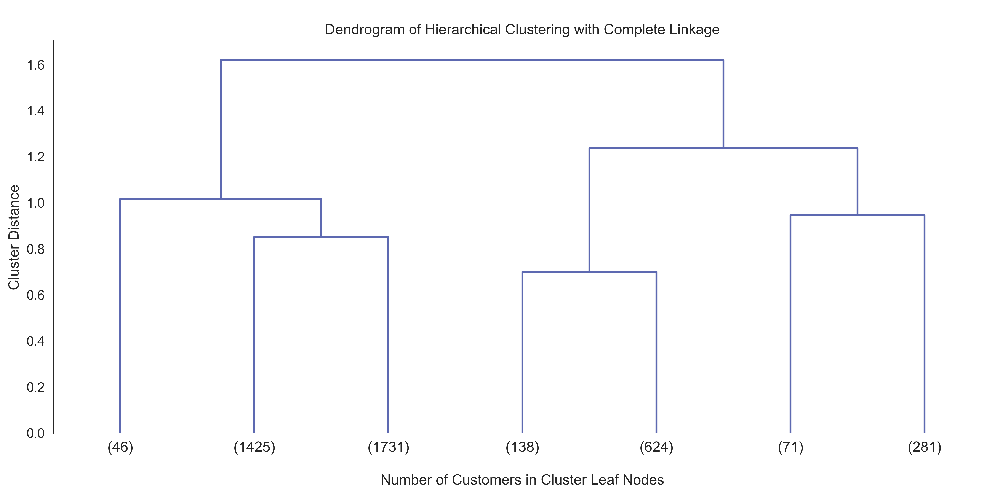

In [46]:
sns.set(rc={'figure.dpi':400})
sns.set_context('notebook')
sns.set_style('ticks')

Z = hierarchy.linkage(X, method='complete', metric='euclidean')
fig, ax = plt.subplots(figsize=(14,6))
hierarchy.set_link_color_palette(['#5d69b1', '#52bca3', '#99c945'])
den = hierarchy.dendrogram(Z, orientation='top', color_threshold=100,
                           p=7, truncate_mode='lastp',
                           show_leaf_counts=True, ax=ax,
                           above_threshold_color='grey')
#ax.axhline(101, color='grey', linestyle='--')
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.tick_params(axis=u'both', which=u'both',length=0)
ax.set_xlabel('\nNumber of Customers in Cluster Leaf Nodes')
ax.set_ylabel('Cluster Distance')
ax.set_title('\nDendrogram of Hierarchical Clustering with Complete Linkage')
fig.show()

In [47]:
# Hierarchical clustering
hc = AgglomerativeClustering(6, affinity='euclidean', linkage='complete', compute_full_tree=False)
hc_label = hc.fit_predict(X)
clusters_results["Hierarchical Cluster"]=hc_label

In [48]:
clusters_results=clusters_results.sort_values(by='Hierarchical Cluster')
clusters_results['Hierarchical Cluster'] = clusters_results['Hierarchical Cluster'].astype(str)

In [54]:
# Plot of clusters                                               
fig = px.scatter(clusters_results, x="RecencyDays", y="GrossRevenueTotal", color="Hierarchical Cluster",
                 color_discrete_sequence=px.colors.qualitative.Vivid[1:])
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="Hierarchical Cluster Profiles,<br>Customer RecencyDays vs. GrossRevenueTotal", 
                  width=700, legend_title = 'Cluster',
                  xaxis=dict(title='RecencyDays',showline=True, zeroline=False), 
                  yaxis=dict(title='GrossRevenueTotal',showline=True))
fig.show()

In [55]:
fig = px.scatter(clusters_results, x="umap_x", y="umap_y", color="Hierarchical Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="Hierarchical Cluster UMAP<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='umap_x', showline=True, zeroline=False), 
                  yaxis=dict(title='umap_y',showline=True, zeroline=False))
fig.show()

In [56]:
fig = px.scatter(clusters_results, x="tsne_x", y="tsne_y", color="Hierarchical Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="Hierarchical Cluster TSNE<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='tsne_x', showline=True, zeroline=False), 
                  yaxis=dict(title='tsne_y',showline=True, zeroline=False))
fig.show()

### Guassian Mistured Model

In [57]:
AIC = []
BIC = []
gmm_ss = []

for k in clusters:
    #model definition
    gmm = GaussianMixture(n_components=k, n_init=5, init_params='k-means++', random_state=42).fit(X)
    labels = gmm.predict(X)
    aic_score=gmm.aic(X)
    bic_score=gmm.bic(X)

    AIC.append(aic_score)
    BIC.append(bic_score)

gmm_resume = pd.DataFrame({"Clusters": clusters,
                           "AIC":AIC,
                           "BIC":BIC})
gmm_resume    

,Clusters,AIC,BIC
0,2,-28431.961364,-28310.929762
1,3,-29335.639309,-29150.906863
2,4,-34938.458471,-34690.025182
3,5,-35250.282918,-34938.148786
4,6,-40331.540135,-39955.705160
5,7,-40527.946965,-40088.411146
6,8,-38941.081003,-38437.844341
7,9,-41181.442323,-40614.504818
8,10,-41915.510425,-41284.872076
9,11,-42369.866590,-41675.527399


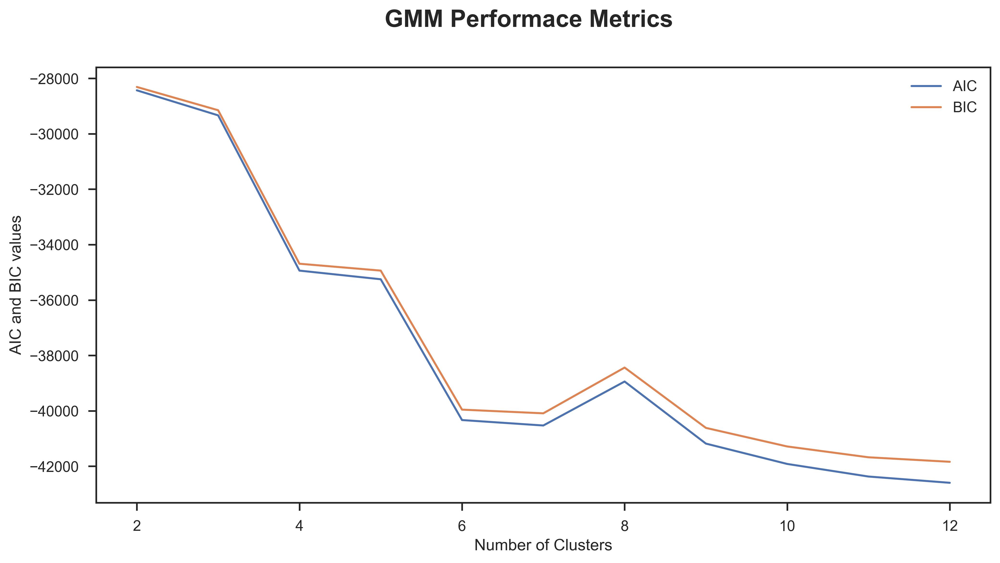

In [58]:
plt.figure(figsize=(12,6))
plt.suptitle('GMM Performace Metrics', fontsize=18, fontweight='bold')
plt.plot(gmm_resume.Clusters, gmm_resume.AIC, label='AIC')
plt.plot(gmm_resume.Clusters, gmm_resume.BIC, label='BIC')
plt.ylabel('AIC and BIC values')
plt.xlabel('Number of Clusters')
plt.legend(loc='best')
plt.show()

### DBScan

### Find Optimal Value

In [59]:
### Outlier Detection

# dbscan = DBSCAN(eps=6, min_samples=12, metric='euclidean')
# labels = dbscan.fit_predict(X)
# clusters_results['DBScan-Cluster'] = labels
# clusters_results=clusters_results.sort_values(by='DBScan-Cluster', ascending=True)
# clusters_results['DBScan-Cluster'] = clusters_results['DBScan-Cluster'].astype(str).apply(lambda x: 'Outliers' if x == '-1' else 0)
# clusters_results['DBScan-Cluster'].value_counts()

In [60]:
# Plot of clusters
# temp = dict(layout=go.Layout(font=dict(family="Franklin Gothic", size=12)))

# fig = px.scatter(clusters_results, x="RecencyDays", y="GrossRevenueTotal", color="DBScan-Cluster", 
#                  color_discrete_sequence=px.colors.qualitative.Prism)
# fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
# fig.update_layout(template=temp, title="DBScan-Cluster Profiles,<br>Frequency vs. Gross Revenue Total", 
#                   width=700, legend_title='Cluster',
#                   xaxis=dict(title='Frequency', showline=True, zeroline=False), 
#                   yaxis=dict(title='GrossRevenueTotal', showline=True)) #ticksuffix='k'
# fig.show()

In [61]:
dbscan = DBSCAN(eps=0.2, min_samples=10, metric='euclidean')
labels = dbscan.fit_predict(X)
clusters_results['DBScan-Cluster'] = labels
clusters_results=clusters_results.sort_values(by='DBScan-Cluster', ascending=True)
clusters_results['DBScan-Cluster'] = clusters_results['DBScan-Cluster'].astype(str).apply(lambda x: 'Outlier' if x == '-1' else x)
clusters_results['DBScan-Cluster'].value_counts()

0          4315
Outlier       1
Name: DBScan-Cluster, dtype: int64

In [62]:
fig = px.scatter(clusters_results, x="Frequency", y="GrossRevenueTotal", color="DBScan-Cluster",
                 color_discrete_sequence=px.colors.qualitative.T10[2:])
fig.update_traces(marker=dict(size=11, opacity=0.85, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="DBSCAN Cluster Profiles,<br>Frequency vs. GrossRevenueTotal", 
                  width=700, legend_title = 'Cluster',
                  xaxis=dict(title='Frequency',showline=True, zeroline=False), 
                  yaxis=dict(title='GrossRevenueTotal',ticksuffix='k',showline=True))
fig.show()


In [67]:
fig = px.scatter(clusters_results, x="RecencyDays", y="GrossRevenueTotal", color="DBScan-Cluster",
                 color_discrete_sequence=px.colors.qualitative.T10[2:])
fig.update_traces(marker=dict(size=11, opacity=0.85, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="DBSCAN Cluster Profiles,<br>RecencyDays vs. GrossRevenueTotal", 
                  width=700, legend_title = 'Cluster',
                  xaxis=dict(title='RecencyDays',showline=True, zeroline=False), 
                  yaxis=dict(title='GrossRevenueTotal',showline=True))
fig.show()

In [68]:
fig = px.scatter(clusters_results, x="RecencyDays", y="Frequency", color="DBScan-Cluster",
                 color_discrete_sequence=px.colors.qualitative.T10[2:])
fig.update_traces(marker=dict(size=11, opacity=0.85, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="DBSCAN Cluster Profiles,<br>Customer Spending vs. Income", 
                  width=700, legend_title = 'Cluster',
                  xaxis=dict(title='Spending Score',showline=True, zeroline=False), 
                  yaxis=dict(title='Income, $',ticksuffix='k',showline=True))
fig.show()

In [69]:
fig = px.scatter(clusters_results, x="umap_x", y="umap_y", color="DBScan-Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="DBScan-Cluster UMAP<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='umap_x', showline=True, zeroline=False), 
                  yaxis=dict(title='umap_y',showline=True, zeroline=False))
fig.show()

fig = px.scatter(clusters_results, x="tsne_x", y="tsne_y", color="DBScan-Cluster", 
                 color_discrete_sequence=px.colors.qualitative.Prism)
fig.update_traces(marker=dict(size=11, opacity=0.75, line=dict(width=1, color='#F7F7F7')))
fig.update_layout(template=temp, title="DBScan-Cluster TSNE<br> RFM", 
                  width=700, legend_title='Cluster',
                  xaxis=dict(title='tsne_x', showline=True, zeroline=False), 
                  yaxis=dict(title='tsne_y',showline=True, zeroline=False))
fig.show()

In [70]:
clusters_results

,GrossRevenueTotal,RecencyDays,Frequency,umap_x,umap_y,tsne_x,tsne_y,KMeans-Cluster,Hierarchical Cluster,DBScan-Cluster
CustomerID,,,,,,,,,,
17501,0.374262,0.899834,0.087123,5.935178,-5.018021,-39.519718,31.615471,3,0,Outlier
15002,0.532297,0.777455,0.196884,14.516551,0.648559,3.025098,55.744591,0,4,0
16769,0.399330,0.931487,0.000000,-4.211048,7.651295,-48.409908,-6.230563,3,4,0
17026,0.317833,0.867053,0.087123,5.436111,-5.010302,-42.221874,27.314619,3,4,0
16984,0.621868,0.727326,0.087123,13.043437,1.393623,-15.660278,23.885662,0,4,0
...,...,...,...,...,...,...,...,...,...,...
17744,0.562625,0.175072,0.269182,13.357978,13.390239,52.013069,-22.317360,1,2,0
15392,0.525029,0.209908,0.196884,12.600767,13.780693,44.762135,-25.913645,1,2,0
12733,0.400176,0.911518,0.000000,-3.855307,7.844350,-46.654610,-8.739008,3,2,0


## Embedding Space

In [71]:
X_prep = X.drop(columns=['GrossRevenueTotal'], axis=1)
y_prep = X['GrossRevenueTotal']

rf = RandomForestRegressor(n_estimators=100, random_state=42)
rf.fit(X_prep,y_prep)

df_leaf_prep = pd.DataFrame(rf.apply(X_prep))
df_leaf_prep

,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,2237,2248,2256,2253,2185,2290,2250,2243,2225,2243,...,2287,2211,2211,2234,2239,2221,2241,2229,2237,2241
1,1902,1957,1885,1877,1904,1917,1926,1860,1914,1909,...,1926,1913,1819,1893,1936,1881,1822,1855,1831,1930
2,2059,2093,2079,2085,2031,2088,2091,2081,2018,2060,...,2116,2053,2059,2065,2077,2049,1970,2064,2063,2051
3,1465,1556,1644,1492,1526,1534,1496,1626,1532,1508,...,1514,1514,1529,1517,1647,1523,1538,1580,1497,1543
4,1187,1225,1225,1205,1207,1207,1192,1211,1209,1195,...,1225,1193,1205,1195,1443,1211,1221,1209,1213,1209
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4311,11,11,14,8,10,6,10,10,8,17,...,17,11,6,12,15,13,6,12,14,9
4312,11,11,14,8,10,6,10,10,8,17,...,17,11,6,12,15,13,6,12,14,9
4313,11,11,14,8,10,6,10,10,8,17,...,17,11,6,12,15,13,6,12,14,9
4314,11,11,14,8,10,6,10,10,8,17,...,17,11,6,12,15,13,6,12,14,9


C:\Users\Alysson\anaconda3\lib\site-packages\sklearn\manifold\_spectral_embedding.py:259: UserWarning:

Graph is not fully connected, spectral embedding may not work as expected.

C:\Users\Alysson\anaconda3\lib\site-packages\umap\spectral.py:260: UserWarning:

failed. This is likely due to too small an eigengap. Consider
adding some noise or jitter to your data.

Falling back to random initialisation!



<AxesSubplot:xlabel='umap_em_x', ylabel='umap_em_y'>

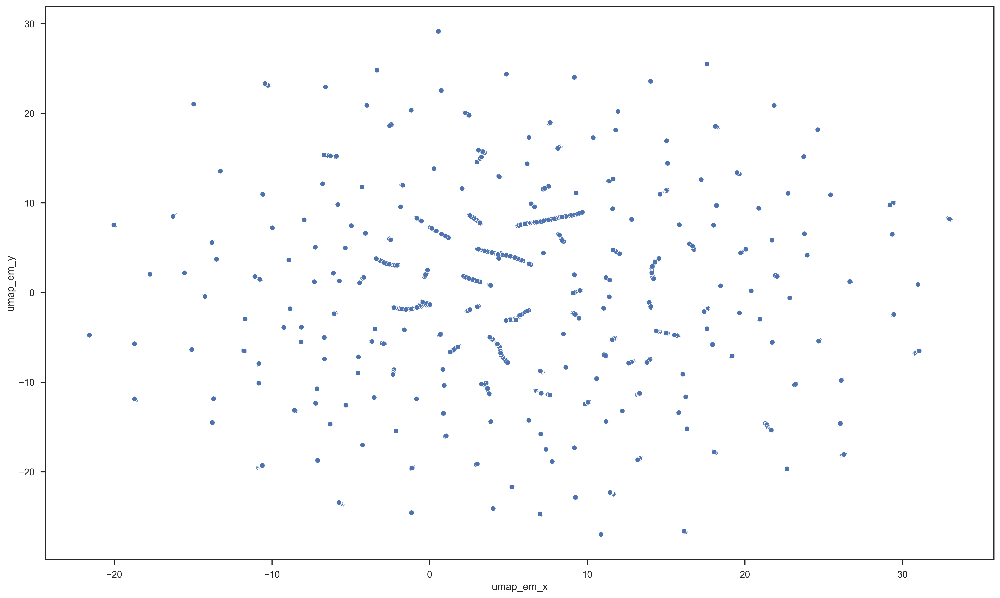

In [72]:
embedding_umap = umap.fit_transform( df_leaf_prep )

#embedding (projection of 1000 dimensions on 2)
df_tree_prep = pd.DataFrame()

df_tree_prep['umap_em_x'] = embedding_umap[:, 0]
df_tree_prep['umap_em_y'] = embedding_umap[:, 1] 
plt.figure(figsize=(20,12));
sns.scatterplot( x='umap_em_x', y='umap_em_y', data=df_tree_prep )

C:\Users\Alysson\anaconda3\lib\site-packages\sklearn\manifold\_t_sne.py:991: FutureWarning:

The PCA initialization in TSNE will change to have the standard deviation of PC1 equal to 1e-4 in 1.2. This will ensure better convergence.



<AxesSubplot:xlabel='tsne_em_x', ylabel='tsne_em_y'>

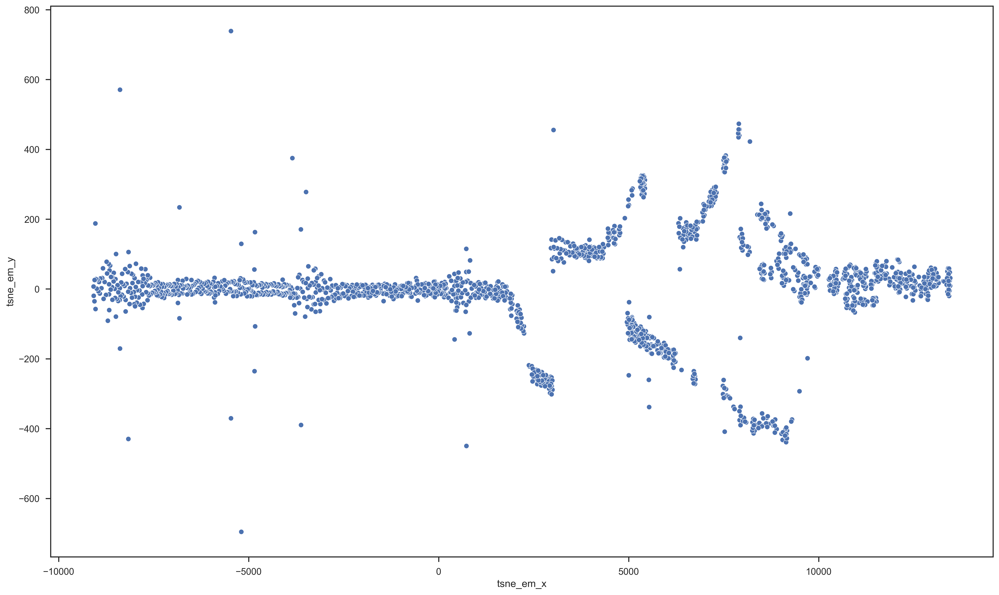

In [73]:
embedding_tsne = tsne.fit_transform( df_leaf_prep )

#embedding (projection of 1000 dimensions on 2)
df_tree_prep = pd.DataFrame()
df_tree_prep['tsne_em_x'] = embedding_tsne[:, 0]
df_tree_prep['tsne_em_y'] = embedding_tsne[:, 1] 
plt.figure(figsize=(20,12));
sns.scatterplot( x='tsne_em_x', y='tsne_em_y', data=df_tree_prep)

In [74]:
#embedding from UMAP (first run)
X_em = clusters_results[['umap_x','umap_y']].copy()
X_em.head()

,umap_x,umap_y
CustomerID,,
17501,5.935178,-5.018021
15002,14.516551,0.648559
16769,-4.211048,7.651295
17026,5.436111,-5.010302
16984,13.043437,1.393623


In [75]:
kmeans_list = []
clusters_em = np.arange(2,13,1)

for k in clusters_em:
    kmeans_em = KMeans( n_clusters=k, n_init=100, random_state=42 )
    kmeans_em.fit(X_em)
    kmeans_labels = kmeans_em.predict(X_em)
    kmeans_ss = silhouette_score(X_em, kmeans_labels, metric='euclidean')
    kmeans_list.append(kmeans_ss)

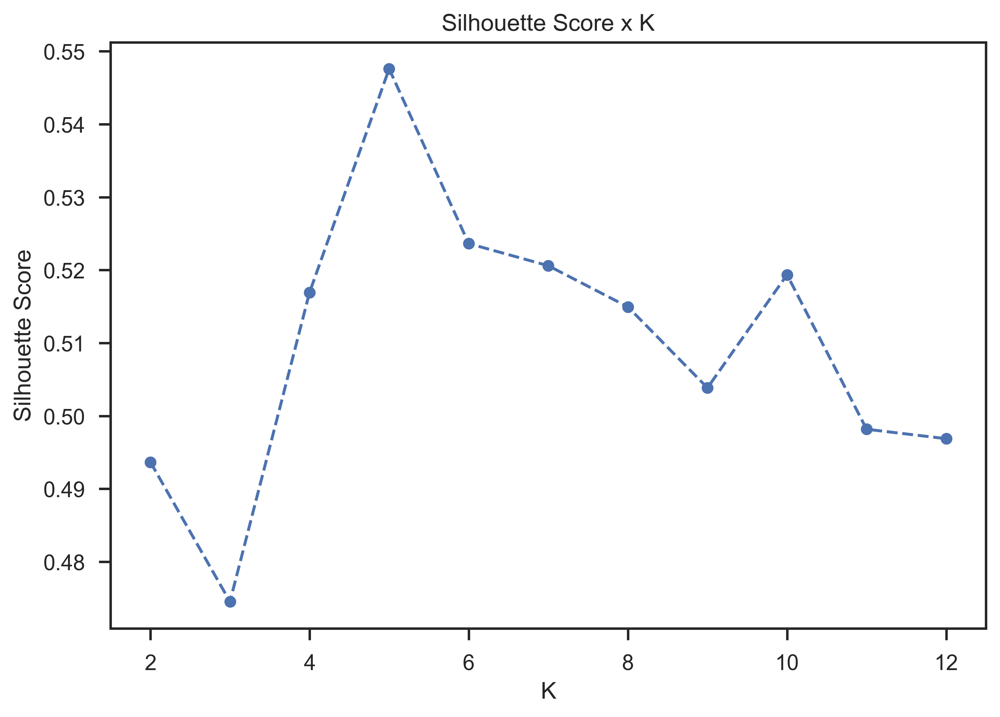

In [76]:
plt.plot(clusters_em, kmeans_list, linestyle='--', marker='o', color='b')
plt.xlabel('K');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score x K');

In [77]:
gmm_list = []
for k in clusters_em:
    gmm_em = GaussianMixture(n_components=k, n_init=10, random_state=42 )#P.S: use always this 2 parameters: n_init=300, random_state=42, or when running again, values of clustering will change.
    gmm_em.fit(X_em)
    gmm_labels = gmm_em.predict(X_em)    
    gmm_ss = silhouette_score(X_em, gmm_labels, metric='euclidean')
    gmm_list.append(gmm_ss)

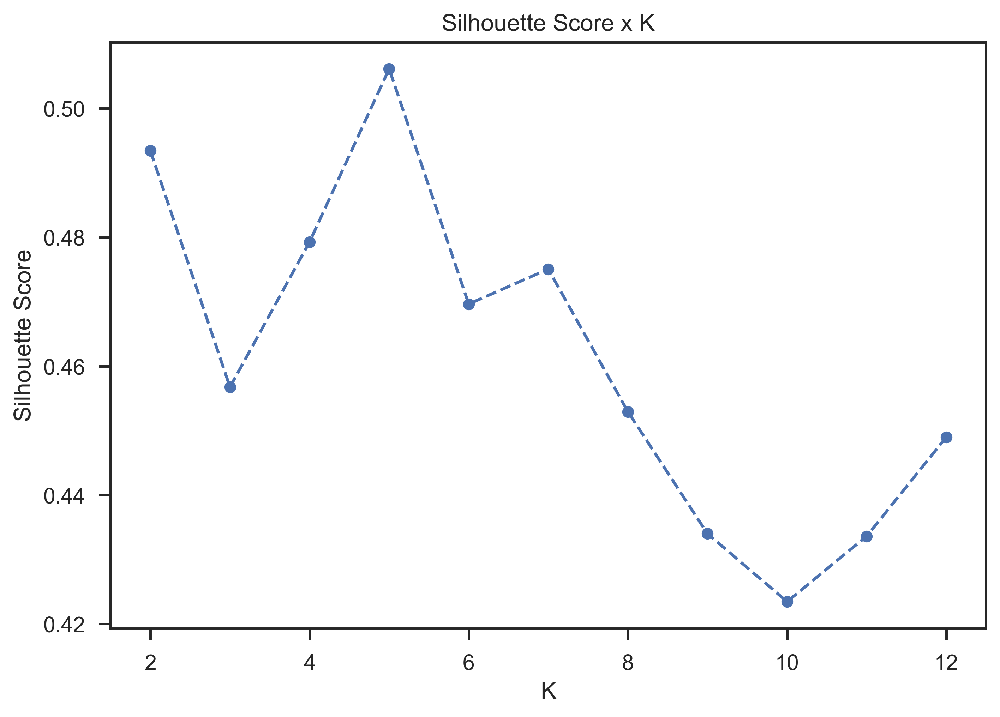

In [78]:
plt.plot(clusters_em, gmm_list, linestyle='--', marker='o', color='b')
plt.xlabel('K');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score x K');

In [79]:
#let's use scipy instead of sklearn, being a simpler implementation.
hc_list = []
for k in clusters_em:
    hc_em = hierarchy.linkage(X_em, 'ward')
    hc_labels = hierarchy.fcluster(hc_em, k, criterion='maxclust')#to cut dendrogram
    hc_ss = silhouette_score(X_em, hc_labels, metric='euclidean')
    hc_list.append(hc_ss) 

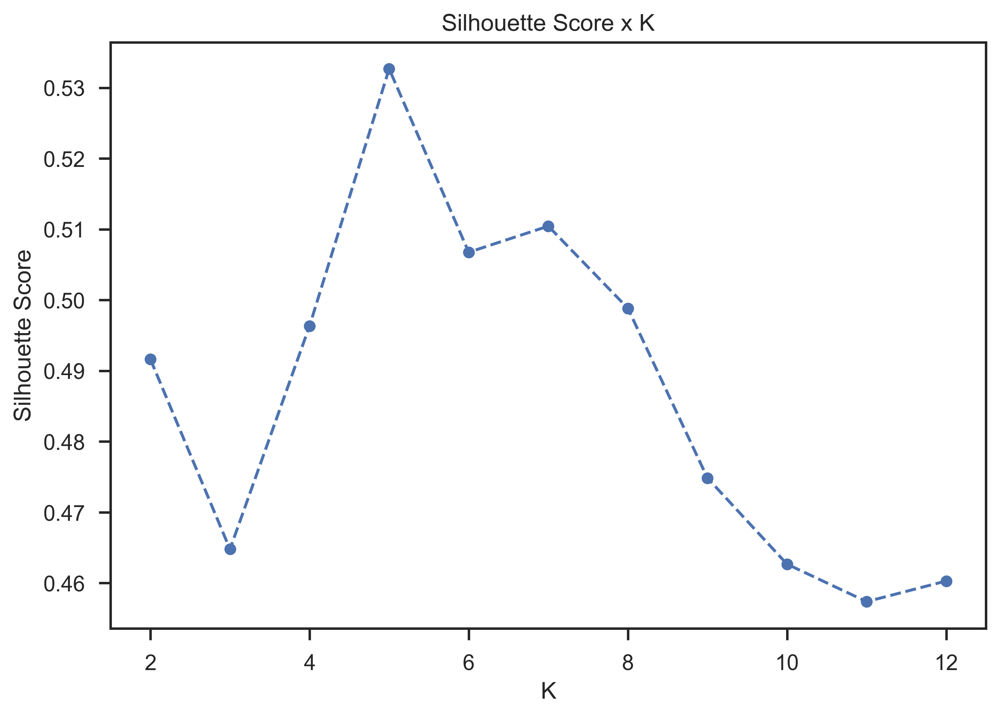

In [80]:
plt.plot(clusters_em, hc_list, linestyle='--', marker='o', color='b')
plt.xlabel('K');
plt.ylabel('Silhouette Score');
plt.title('Silhouette Score x K');

In [81]:
# k=7
# hc_em = hierarchy.linkage(X_em, 'ward')
# hc_em_labels = hierarchy.fcluster(hc_em, k, criterion='maxclust') 
# clusters_results['HC-Embeeded'] = hc_em_labels

In [82]:
# Hierarchical clustering
hc_em = AgglomerativeClustering(8, affinity='euclidean', linkage='complete', compute_full_tree=False)
hc_em_labels = hc_em.fit_predict(X_em)
clusters_results['HC-Embeeded'] = hc_em_labels

In [91]:
k=8
kmeans_em = KMeans( n_clusters=k, max_iter=300, n_init=1, init = "k-means++", verbose=0,random_state=3456) 
kmeans_em_labels = kmeans_em.fit_predict(X_em)
clusters_results['KMeans-Embeeded'] = kmeans_em_labels

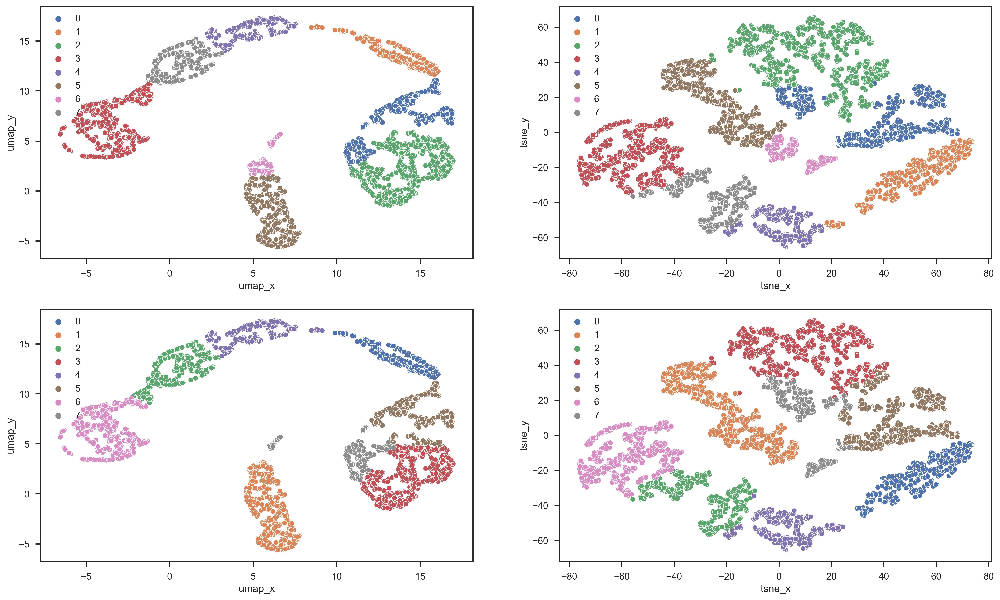

In [92]:
plt.figure(figsize=(20,12))
plt.title('HC Embbedded')
plt.subplot(2, 2, 1)
sns.scatterplot(x='umap_x', y='umap_y', hue='HC-Embeeded', data=clusters_results, palette='deep')
plt.legend()
plt.subplot(2, 2, 2)
sns.scatterplot(x='tsne_x', y='tsne_y', hue='HC-Embeeded', data=clusters_results, palette='deep')
plt.legend()
plt.subplot(2, 2, 3)
sns.scatterplot(x='umap_x', y='umap_y', hue='KMeans-Embeeded', data=clusters_results, palette='deep')
plt.legend()
plt.subplot(2, 2, 4)
sns.scatterplot(x='tsne_x', y='tsne_y', hue='KMeans-Embeeded', data=clusters_results, palette='deep')
plt.legend()

### Evaluating

In [93]:
data_client['Cluster'] = hc_em_labels

In [94]:
data_client.sort_values(by='GrossRevenueTotal', ascending=False)

,GrossRevenueTotal,RecencyDays,Frequency,Cluster
CustomerID,,,,
14646,279489.02,2.0,73.0,2
18102,256438.49,1.0,60.0,1
17450,187482.17,9.0,46.0,2
14911,132572.62,2.0,201.0,4
12415,123725.45,25.0,21.0,2
...,...,...,...,...
17900,15.00,191.0,2.0,1
13307,15.00,121.0,1.0,2
17763,15.00,264.0,1.0,2


In [95]:
report = data_client.groupby("Cluster").agg( MonetarySum = ('GrossRevenueTotal', 'sum'),
                                             MonetaryMean = ('GrossRevenueTotal', 'mean'),
                                             Recency = ('RecencyDays', 'mean'),
                                             Frequency = ('Frequency', 'mean'),
                                             Count = ('GrossRevenueTotal', 'count')).reset_index()

In [96]:
report['Percentage'] = round((report['Count'] / report['Count'].sum()*100),2)

In [97]:
report.sort_values(by='MonetaryMean', ascending=False)

,Cluster,MonetarySum,MonetaryMean,Recency,Frequency,Count,Percentage
2,2,2321180.32,2337.543122,93.245720,4.364552,993,23.01
4,4,738973.08,2273.763323,96.055385,5.587692,325,7.53
7,7,834001.38,2149.488093,103.396907,4.755155,388,8.99
1,1,954223.86,1916.112169,96.592369,3.785141,498,11.54
5,5,1125058.71,1878.228230,93.020033,4.697830,599,13.88
3,3,1225328.15,1758.003085,87.717360,4.243902,697,16.15
6,6,275342.62,1496.427283,85.141304,3.320652,184,4.26
0,0,839482.73,1328.295459,88.488924,3.549051,632,14.64


In [90]:
report['Cluster'] = ['Champion', 'Loyal Costumer', 'Potential Loyalist','About to Sleep', 'Need Atention', 'At Risk','Promissing', 'Hinernating']
report

,Cluster,MonetarySum,MonetaryMean,Recency,Frequency,Count,Percentage
0,Champion,839482.73,1328.295459,88.488924,3.549051,632,14.64
1,Loyal Costumer,954223.86,1916.112169,96.592369,3.785141,498,11.54
2,Potential Loyalist,2321180.32,2337.543122,93.245720,4.364552,993,23.01
3,About to Sleep,1225328.15,1758.003085,87.717360,4.243902,697,16.15
4,Need Atention,738973.08,2273.763323,96.055385,5.587692,325,7.53
5,At Risk,1125058.71,1878.228230,93.020033,4.697830,599,13.88
6,Promissing,275342.62,1496.427283,85.141304,3.320652,184,4.26
7,Hinernating,834001.38,2149.488093,103.396907,4.755155,388,8.99


In [340]:
# report['Cluster'] = ['Rank1', 'Rank2', 'Rank3','Rank4', 'Rank5', 'Rank6','Rank7', 'Rank8']
# report.set_index('Cluster', inplace=True)
# report

In [341]:
data_client_clustered = data_client.copy()
data_client_clustered['Cluster'] = labels
data_client_clustered.sample(10)

,GrossRevenueTotal,RecencyDays,Frequency,Cluster
CustomerID,,,,
17502,689.10,10.0,4.0,4
13199,9803.96,4.0,38.0,-1
15793,948.96,15.0,3.0,2
17188,2275.58,12.0,7.0,0
16706,531.35,38.0,3.0,2
13388,627.15,132.0,2.0,3
18221,1033.31,23.0,5.0,0
13917,272.04,50.0,2.0,3
16292,280.90,122.0,1.0,1


# Conclusion

Of the models that were used, only Kmeans showed good results, with the incorporation of embedded models, algorithms such as kmenas and hierarchical cluster improved a lot.